# Crossview - Autoencoder


***Useful Links:***
- [***report***](https://www.overleaf.com/project/661be733fb018b56f8400782)
- [keras implementation 2024](https://www.analyticsvidhya.com/blog/2023/07/mnist-image-reconstruction-using-an-autoencoder/)
- [reference decoder](https://github.com/ugo-nama-kun/conv_ae/blob/main/ae.py)

***To Do's:***
- data augmentation
- test the dataset split


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from tqdm import tqdm
from torchvision.transforms.functional import to_tensor, to_pil_image
import matplotlib.pyplot as plt
import shutil
import timm
from utils import *
from skimage.metrics import structural_similarity as ssim


# # Set the device
# !export CUDA_VISIBLE_DEVICES=0

## Training

using device: cuda


Using cache found in /home/lrusso/.cache/torch/hub/facebookresearch_dinov2_main


ViTEncoder(
  (vit): _LinearClassifierWrapper(
    (backbone): DinoVisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
        (norm): Identity()
      )
      (blocks): ModuleList(
        (0-11): 12 x NestedTensorBlock(
          (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
          (attn): MemEffAttention(
            (qkv): Linear(in_features=384, out_features=1152, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=384, out_features=384, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=384, out_features=1536, bias=True)
            (act): GELU(approximate='none')
            (fc2): Linear(in_features=1536, out_feature

/home/lrusso/miniconda3/envs/crossview/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/lrusso/miniconda3/envs/crossview/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 10/10: 100%|██████████| 135/135 [02:06<00:00,  1.07it/s]


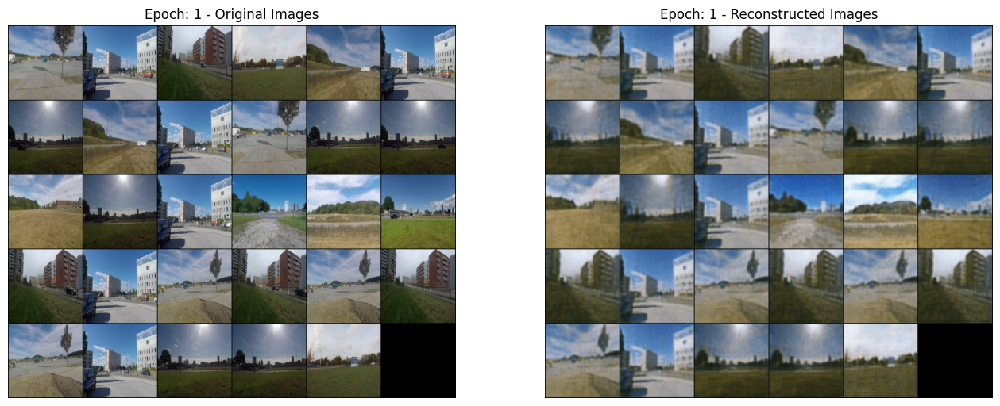

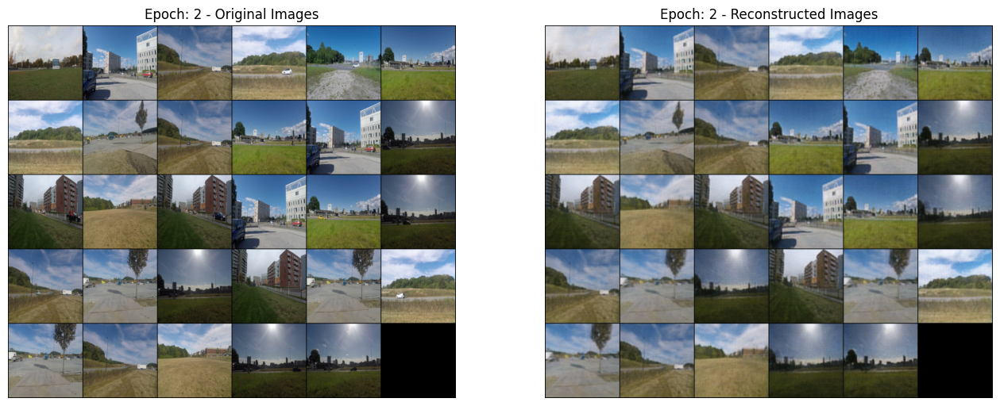

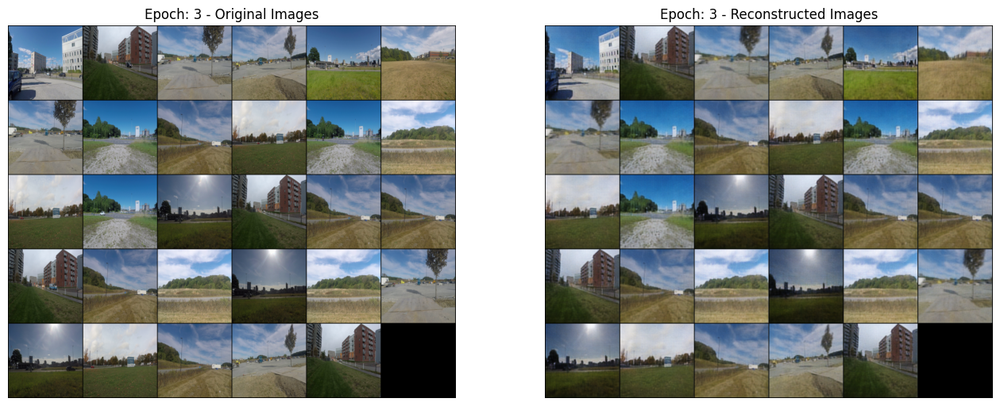

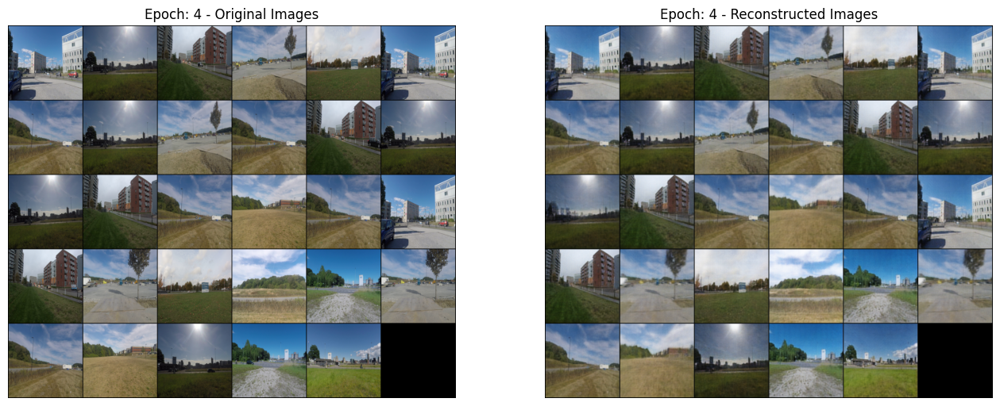

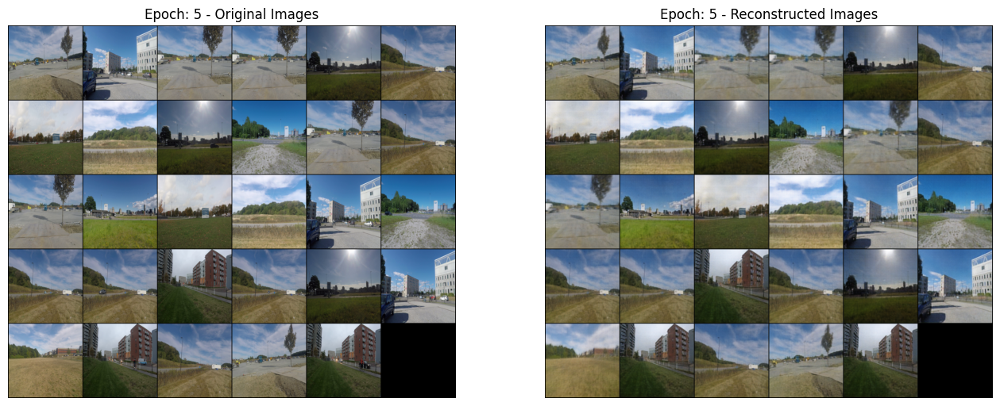

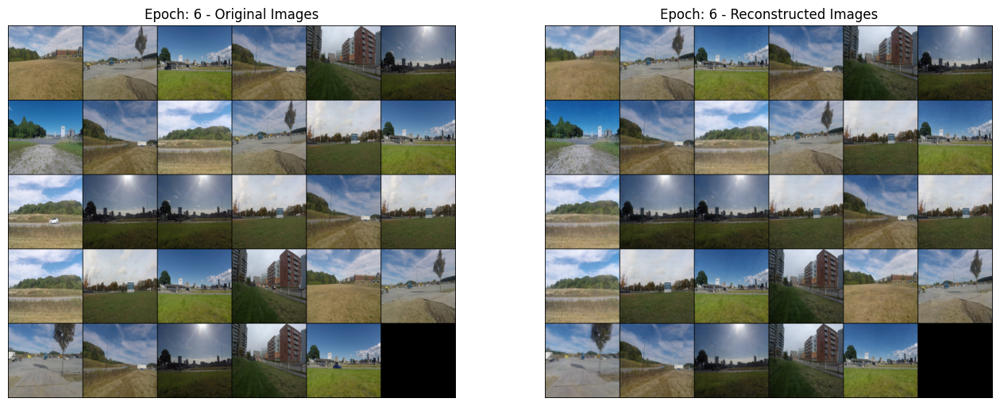

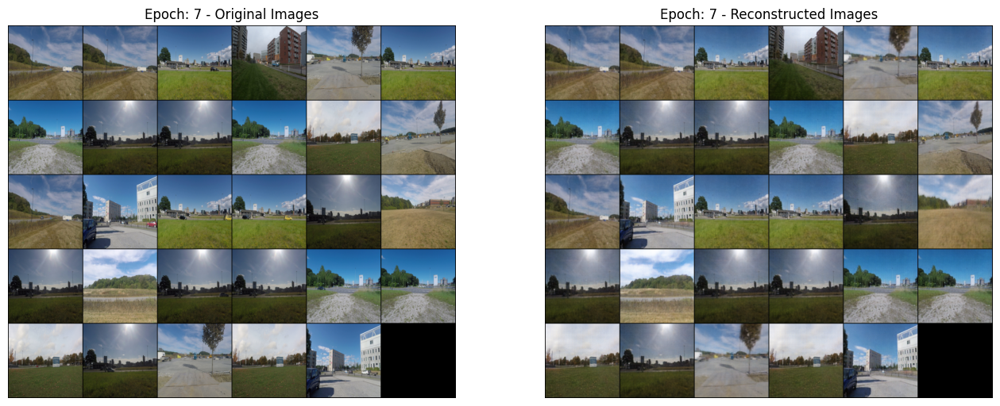

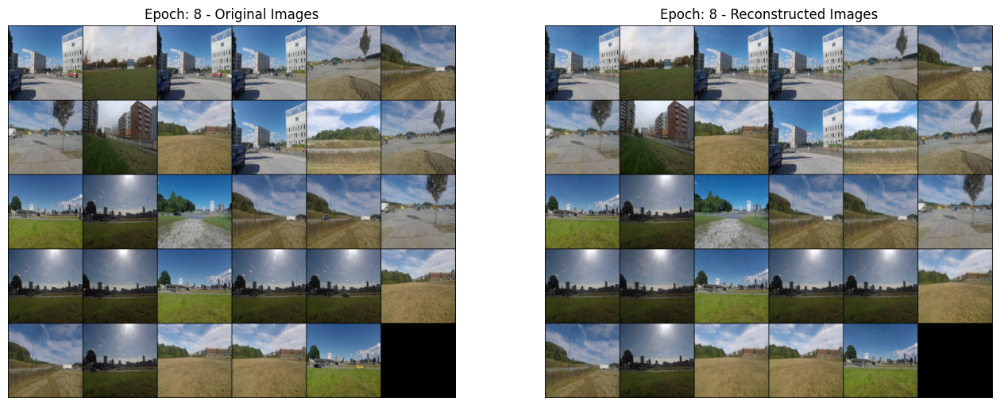

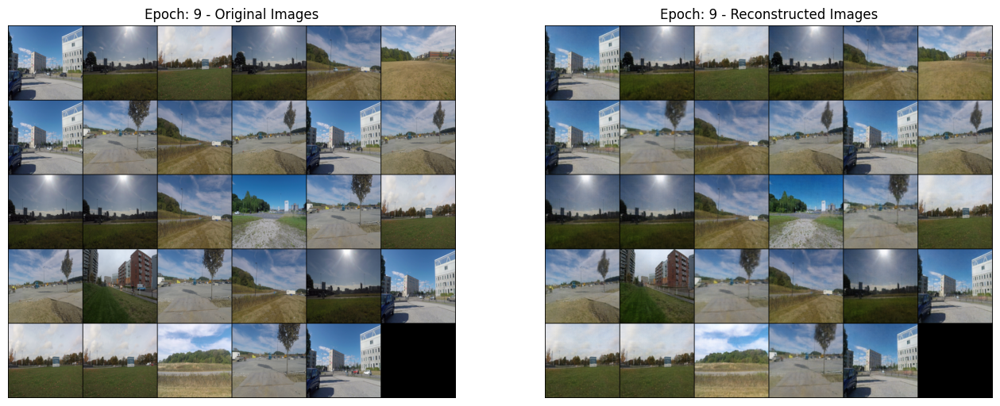

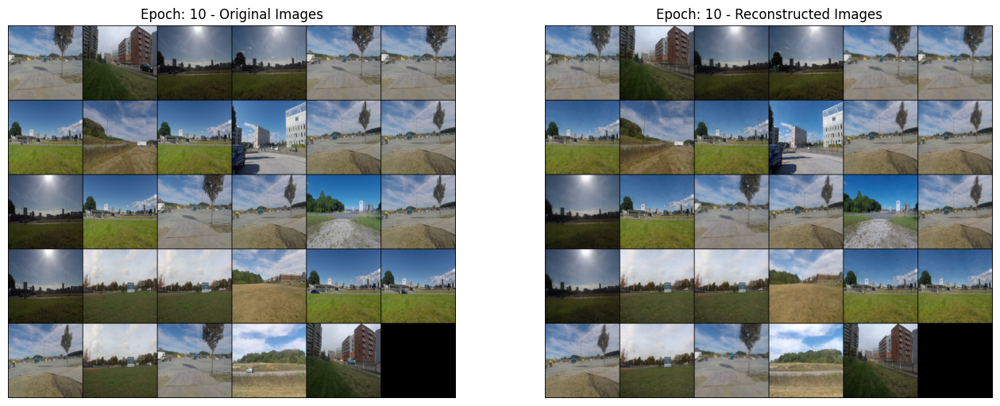

In [4]:
# Constants
image_channels = 3          # for RGB images
image_size = 224            # assuming square images
hidden_dims = 512           # hidden dimensions
output_dims = 100          # size of phi
batch_size = 64
shuffle = True


# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"using device: {device}")

# Initialize Encoder and Decoder
encoder = ViTEncoder(out_features=output_dims, model_name='dinov2_vitl14_reg_lc').to(device)
decoder = Decoder(input_dims=output_dims, hidden_dims=hidden_dims, output_channels=3, initial_size=7).to(device)
# encoder = Encoder(latent_dim=output_dims).to(device)
print(encoder, decoder)

# Optimizer and Loss Function
learning_rate = 1e-3
optimizer = optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=learning_rate)
combined_loss = CombinedLoss(device=device)
perceptual_loss = PerceptualLoss().to(device)
criterion = nn.HuberLoss()
# criterion = nn.MSELoss()

# Transformations
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.CenterCrop((image_size, image_size)),
    transforms.ToTensor()
])

# Define the Datasets
train_dataset = CustomDataset('dataset/labelled/train/ground', transform=transform)
val_dataset = CustomDataset('dataset/labelled/val/ground', transform=transform)

# Define the DataLoaders
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle, num_workers=4)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=shuffle)


# ----- Training ----- #

def train(encoder, decoder, train_loader, val_loader, device, criterion, optimizer, epochs=10, save_path='untitled'):

    encoder.to(device)
    decoder.to(device)

    model_path = os.path.join('models', save_path)
    metrics_path = os.path.join('models', save_path, 'metrics')
    results_path = os.path.join('models', save_path, 'results')
    os.makedirs('models', exist_ok=True)
    os.makedirs(model_path, exist_ok=True)
    os.makedirs(metrics_path, exist_ok=True)
    os.makedirs(results_path, exist_ok=True)

    
    # Metrics storage
    epochs_data = []
    train_loss_data = []
    val_loss_data = []
    val_psnr_data = []
    val_ssim_data = []

    for epoch in range(epochs):
        encoder.train()
        decoder.train()
        running_loss = 0.0

        for images in tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}'):
            images = images.to(device)
            optimizer.zero_grad()
            encoded_imgs = encoder(images)
            decoded_imgs = decoder(encoded_imgs)
            loss = criterion(decoded_imgs, images)
            # loss = combined_loss(decoded_imgs, images)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        avg_loss = running_loss / len(train_loader)
        train_loss_data.append(avg_loss)
        epochs_data.append(epoch + 1)
        
        # Validation and metrics collection
        val_loss, val_psnr, val_ssim = validate(encoder, decoder, val_loader, criterion, device)
        val_loss_data.append(val_loss)
        val_psnr_data.append(val_psnr)
        val_ssim_data.append(val_ssim)

        # Plotting the metrics
        plot_metrics(epochs_data, train_loss_data, val_loss_data, val_psnr_data, val_ssim_data, metrics_path)

        # Visualize the reconstructed images
        visualize_reconstruction(images, decoded_imgs, epoch, save_path=results_path)
        
        # Save the Model
        torch.save(encoder.state_dict(), os.path.join(model_path, f'encoder_epoch_{epoch+1}.pth'))
        torch.save(decoder.state_dict(), os.path.join(model_path, f'decoder_epoch_{epoch+1}.pth'))


def validate(encoder, decoder, loader, criterion, device):
    encoder.eval()
    decoder.eval()
    validation_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    with torch.no_grad():
        for images in loader:
            images = images.to(device)
            encoded_imgs = encoder(images)
            decoded_imgs = decoder(encoded_imgs)
            loss = criterion(decoded_imgs, images)
            validation_loss += loss.item()

            # Calculate PSNR
            total_psnr += psnr(images, decoded_imgs)

            # Calculate SSIM for each image in the batch
            for i in range(images.size(0)):
                img1 = images[i].squeeze().cpu().numpy()
                img2 = decoded_imgs[i].squeeze().cpu().numpy()
                ssim_value = ssim(img1, img2, data_range=1, channel_axis=0, win_size=5)     # data_range=1 for normalized images
                total_ssim += ssim_value


    avg_val_loss = validation_loss / len(loader)
    avg_psnr = total_psnr / len(loader)
    avg_ssim = total_ssim / (len(loader) * images.size(0))  # Normalize by total number of images
    return avg_val_loss, avg_psnr, avg_ssim


train(encoder, decoder, train_dataloader, val_dataloader, device, criterion, optimizer, epochs=10, save_path='sDINO + HuberLoss')

### Visualize Transformations

In [5]:
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision import transforms

image_size = 224        # assuming square images

# Transformations
transform = transforms.Compose([
    transforms.Resize(image_size),  # Resize the shortest edge to image_size
    transforms.CenterCrop((image_size, image_size)),  # Crop the center square of the image
    transforms.ToTensor(),  # Convert images to Torch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize images
])


# Load Sample Image
image_path = 'dataset/labelled/train/aerial/scene_1_Cortex_Park_crossroads_drone_000000.PNG'  # Update this to the path of your image
image = Image.open(image_path).convert('RGB')

# Apply the transformation
transformed_image = transform(image)

# Denormalize the transformed image
denormalized_transformed_image = denormalize(transformed_image.squeeze())

# Convert denormalized image back to PIL for displaying
denormalized_transformed_image_pil = to_pil_image(denormalized_transformed_image)

# Display the original and denormalized transformed images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(denormalized_transformed_image_pil)
axs[1].set_title('Transformed Image')
axs[1].axis('off')

plt.show()


NameError: name 'denormalize' is not defined